# Projeto de Regressão Logística


Desenvolver modelo para prever cliques em anúncios com base em dados fictícios de usuários.

recursos:

* **tempo_diario_site**: tempo diário no site em minutos.
* **idade**: idade do consumidor.
* **renda_media_regiao**: Média da renda do consumidor na região.
* **tempo_medio_internet**: Média em minutos por dia que o consumidor está na internet.
* **titulo**: Título do anúncio.
* **cidade**: Cidade do consumidor.
* **sexo**: Se o consumidor era ou não masculino.
* **pais**: País do consumidor.
* **timestamp_clique'**: hora em que o consumidor clicou no anúncio ou janela fechada.
* **clique**: 0 ou 1 indicam se clicou ou não no anúncio.

## Etapas do projeto
- Coleta de dados
- Análise de dados
- Criação de modelos
- Validação de modelos
- Apresentação dos resultados

In [7]:
## Importar bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from phik import phik_matrix

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

## 1. Coleta de dados

In [2]:
anuncios = pd.read_csv('advertising.csv')

** Verifique o cabeçalho do ad_data **

In [3]:
anuncios.head()

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0


** Use info() e describe() em ad_data **

In [4]:
anuncios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tempo_diario_site     1000 non-null   float64
 1   idade                 1000 non-null   int64  
 2   renda_media_regiao    1000 non-null   float64
 3   tempo_medio_internet  1000 non-null   float64
 4   titulo                1000 non-null   object 
 5   cidade                1000 non-null   object 
 6   sexo                  1000 non-null   int64  
 7   pais                  1000 non-null   object 
 8   timestamp_clique      1000 non-null   object 
 9   clique                1000 non-null   int64  
dtypes: float64(3), int64(3), object(4)
memory usage: 78.2+ KB


In [5]:
anuncios.describe()

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,sexo,clique
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,65.000200,36.009000,55000.000080,180.000100,0.481000,0.50000
std,15.853615,8.785562,13414.634022,43.902339,0.499889,0.50025
min,32.600000,19.000000,13996.500000,104.780000,0.000000,0.00000
25%,51.360000,29.000000,47031.802500,138.830000,0.000000,0.00000
50%,68.215000,35.000000,57012.300000,183.130000,0.000000,0.50000
75%,78.547500,42.000000,65470.635000,218.792500,1.000000,1.00000
max,91.430000,61.000000,79484.800000,269.960000,1.000000,1.00000


## 2. Análise de dados exploratória

- Vamos usar o Pandas profiling para gerar um relatórios dos dados
- Vamos usar o Seaborn para explorar os insights!


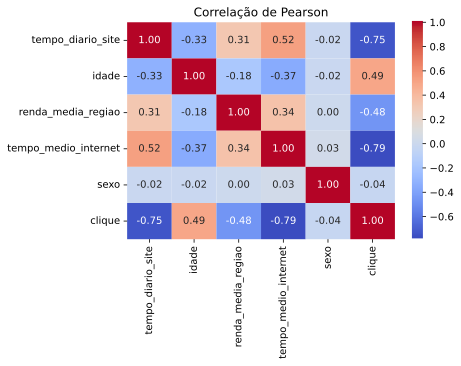

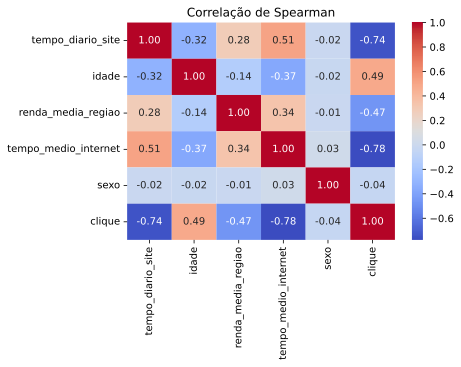

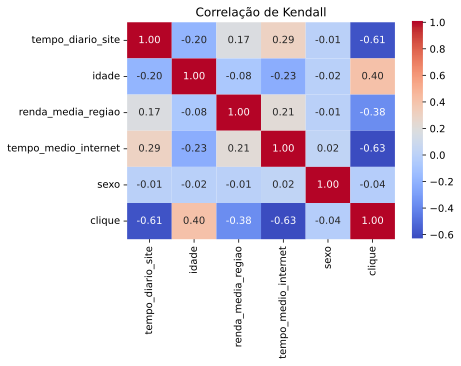

interval columns not set, guessing: ['tempo_diario_site', 'idade', 'renda_media_regiao', 'tempo_medio_internet', 'sexo', 'clique']


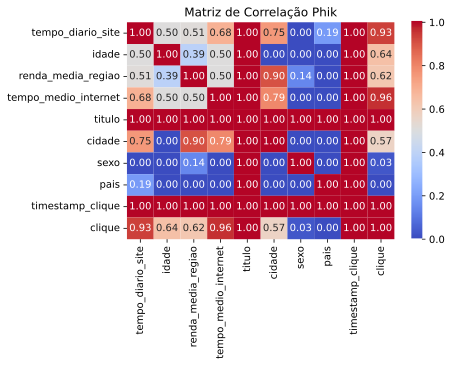

'\nA matriz de correlação Phik é uma medida de correlação entre variáveis categóricas.\nEla lida bem com dados mistos (categóricos e numéricos) e fornece uma visão global\ndas associações entre as variáveis.\n'

In [8]:
# Calculando a correlação de Pearson
correlation_pearson = anuncios.corr(method='pearson')

# Plotando heatmap para a correlação de Pearson
sns.heatmap(correlation_pearson, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlação de Pearson")
plt.show()

# Comentário explicativo para a correlação de Pearson
"""
A correlação de Pearson mede a relação linear entre duas variáveis contínuas.
Valores próximos a 1 indicam uma forte correlação positiva, valores próximos a -1
indicam uma forte correlação negativa, e valores próximos a 0 indicam uma
correlação fraca.
"""

# Calculando a correlação de Spearman
correlation_spearman = anuncios.corr(method='spearman')

# Plotando heatmap para a correlação de Spearman
sns.heatmap(correlation_spearman, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlação de Spearman")
plt.show()

# Comentário explicativo para a correlação de Spearman
"""
A correlação de Spearman é uma medida de correlação não paramétrica que avalia
a relação monotônica entre duas variáveis. Valores próximos a 1 ou -1 indicam uma
correlação forte, enquanto valores próximos a 0 indicam uma correlação fraca.
"""

# Calculando a correlação de Kendall
correlation_kendall = anuncios.corr(method='kendall')

# Plotando heatmap para a correlação de Kendall
sns.heatmap(correlation_kendall, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlação de Kendall")
plt.show()

# Comentário explicativo para a correlação de Kendall
"""
A correlação de Kendall é outra medida de correlação não paramétrica, avaliando a
concordância entre duas variáveis. Valores próximos a 1 ou -1 indicam uma
correlação forte, enquanto valores próximos a 0 indicam uma correlação fraca.
"""

# Calculando a matriz de correlação Phik
correlation_phik = phik_matrix(anuncios)

# Plotando heatmap para a matriz de correlação Phik
sns.heatmap(correlation_phik, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlação Phik")
plt.show()

# Comentário explicativo para a matriz de correlação Phik
"""
A matriz de correlação Phik é uma medida de correlação entre variáveis categóricas.
Ela lida bem com dados mistos (categóricos e numéricos) e fornece uma visão global
das associações entre as variáveis.
"""


In [9]:
# Verificando se há linhas duplicadas em todas as colunas
duplicates = anuncios.duplicated()

# Mostrando as linhas duplicadas (se houver)
duplicated_rows = anuncios[duplicates]
print("Linhas duplicadas em todas as colunas:")
print(duplicated_rows)


Linhas duplicadas em todas as colunas:
Empty DataFrame
Columns: [tempo_diario_site, idade, renda_media_regiao, tempo_medio_internet, titulo, cidade, sexo, pais, timestamp_clique, clique]
Index: []


In [10]:
# Verificando se há dados faltantes em cada coluna
dados_faltantes = anuncios.isnull().sum()

# Mostrando a contagem de dados faltantes por coluna
print("Dados faltantes por coluna:")
print(dados_faltantes)


Dados faltantes por coluna:
tempo_diario_site       0
idade                   0
renda_media_regiao      0
tempo_medio_internet    0
titulo                  0
cidade                  0
sexo                    0
pais                    0
timestamp_clique        0
clique                  0
dtype: int64


In [11]:
# Verificando se há dados faltantes em todo o DataFrame
dados_faltantes_total = dados_faltantes.any()

# Mostrando se há dados faltantes em todo o DataFrame
print("Há dados faltantes em todo o DataFrame:", dados_faltantes_total)


Há dados faltantes em todo o DataFrame: False


### Questionamentos 

- Existem dados ausentes? 
    - Não!
- Precisamos representar variáveis de outra forma? 
    - Sim a variável timestamp 
- Existem dados duplicados?
    - Não 
- Existem features compostas?
    - Sim a variável timestamp 
- Podemos integrar mais dados para análise?
    - Não! 
- Quais perguntas eu posso responder com estes dados?
- Como estão os dados? As feature alvo é balanceada?

### Informações
- São 10 variáveis (4 numericas e 6 categoricas: 3 float64, 3 int64 e 4 object)

### Insights

** transformação de feature composta timestamp_clique **

In [12]:
anuncios['timestamp_clique']

0      2016-03-27 00:53:11
1      2016-04-04 01:39:02
2      2016-03-13 20:35:42
3      2016-01-10 02:31:19
4      2016-06-03 03:36:18
              ...         
995    2016-02-11 21:49:00
996    2016-04-22 02:07:01
997    2016-02-01 17:24:57
998    2016-03-24 02:35:54
999    2016-06-03 21:43:21
Name: timestamp_clique, Length: 1000, dtype: object

In [13]:
anuncios['timestamp_clique'].dtype

dtype('O')

In [14]:
anuncios['timestamp_clique'] = pd.to_datetime(anuncios['timestamp_clique'])

In [15]:
anuncios['ano'] = anuncios['timestamp_clique'].dt.year
anuncios['mes'] = anuncios['timestamp_clique'].dt.month
anuncios['day'] = anuncios['timestamp_clique'].dt.day

In [16]:
anuncios

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique,ano,mes,day
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,2016,3,27
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,2016,4,4
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,2016,3,13
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,2016,1,10
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,2016,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,71384.57,208.58,Fundamental modular algorithm,Duffystad,1,Lebanon,2016-02-11 21:49:00,1,2016,2,11
996,51.30,45,67782.17,134.42,Grass-roots cohesive monitoring,New Darlene,1,Bosnia and Herzegovina,2016-04-22 02:07:01,1,2016,4,22
997,51.63,51,42415.72,120.37,Expanded intangible solution,South Jessica,1,Mongolia,2016-02-01 17:24:57,1,2016,2,1
998,55.55,19,41920.79,187.95,Proactive bandwidth-monitored policy,West Steven,0,Guatemala,2016-03-24 02:35:54,0,2016,3,24


In [17]:
anuncios['timestamp_clique'].dtype

dtype('<M8[ns]')

In [18]:
anuncios

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique,ano,mes,day
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,2016,3,27
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,2016,4,4
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,2016,3,13
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,2016,1,10
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,2016,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,71384.57,208.58,Fundamental modular algorithm,Duffystad,1,Lebanon,2016-02-11 21:49:00,1,2016,2,11
996,51.30,45,67782.17,134.42,Grass-roots cohesive monitoring,New Darlene,1,Bosnia and Herzegovina,2016-04-22 02:07:01,1,2016,4,22
997,51.63,51,42415.72,120.37,Expanded intangible solution,South Jessica,1,Mongolia,2016-02-01 17:24:57,1,2016,2,1
998,55.55,19,41920.79,187.95,Proactive bandwidth-monitored policy,West Steven,0,Guatemala,2016-03-24 02:35:54,0,2016,3,24


###### ** Qual a idade padrão dos consumidores? 

Text(0.5, 0, 'idade')

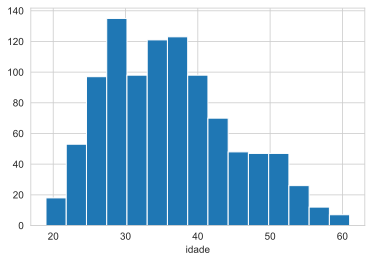

In [19]:
sns.set_style('whitegrid')
anuncios['idade'].hist(bins=15)
plt.xlabel('idade')

- Uma grande parte dos consumidores possuem idade entre 25 e 45 anos

In [20]:
anuncios.head()

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique,ano,mes,day
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,2016,3,27
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,2016,4,4
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,2016,3,13
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,2016,1,10
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,2016,6,3


###### Consumidores mais velhos possuem renda média da região maiores do que os mais novos?

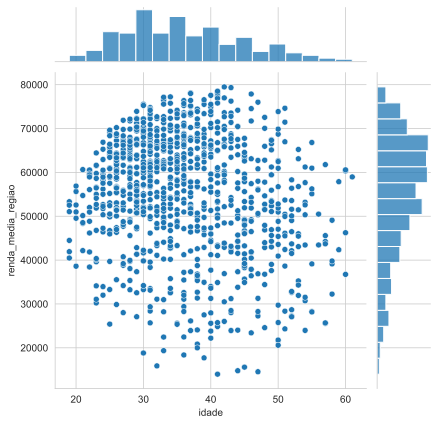

In [21]:
sns.jointplot(x='idade', y='renda_media_regiao',data=anuncios)

- Não existe uma linearidade muito forte entre as variáveis
- A renda não é tão dependente da idade

######  Pessoas mais novas gastam mais tempo no site do que pessoas mais velhas??

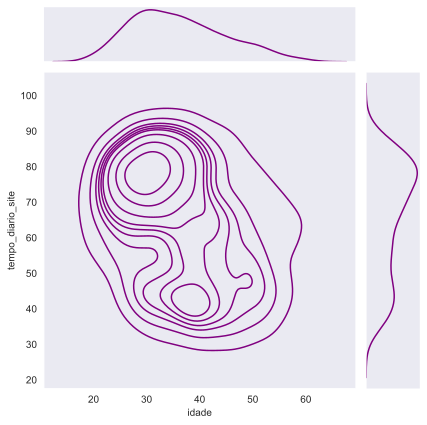

In [22]:
##use KDE
sns.set_style('dark')
sns.jointplot(x='idade',y='tempo_diario_site',data=anuncios, kind='kde', color='purple');

- Existe uma concentração de pontos na parte superior do gráfico mais a esquerda
- Com o KDE conseguimos exerga que as pessoas que gastam mais tempo no site
- A concentração de consumidores com idades entre 20 e 40 anos e tempo médio diário de 70 a 80 possuem uma maior concentração 

In [23]:
anuncios

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique,ano,mes,day
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,2016,3,27
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,2016,4,4
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,2016,3,13
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,2016,1,10
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,2016,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,71384.57,208.58,Fundamental modular algorithm,Duffystad,1,Lebanon,2016-02-11 21:49:00,1,2016,2,11
996,51.30,45,67782.17,134.42,Grass-roots cohesive monitoring,New Darlene,1,Bosnia and Herzegovina,2016-04-22 02:07:01,1,2016,4,22
997,51.63,51,42415.72,120.37,Expanded intangible solution,South Jessica,1,Mongolia,2016-02-01 17:24:57,1,2016,2,1
998,55.55,19,41920.79,187.95,Proactive bandwidth-monitored policy,West Steven,0,Guatemala,2016-03-24 02:35:54,0,2016,3,24


###### Quem usa mais a internet gasta mais?

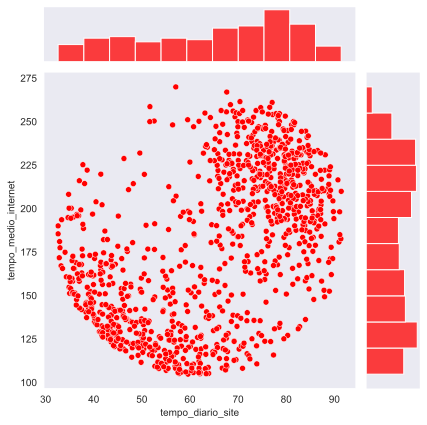

In [24]:
sns.jointplot(x='tempo_diario_site',y='tempo_medio_internet',data=anuncios, color='red');

- pessoas que ficam mais tempo no site constumam ficar mais tempo em outros sites da internet
- pessoas que ficam poouco tempo no site tendem a ficar menos tempo também em sites na internet

######  Quem são os consumidores que clicaram mais no site??

In [25]:
sns.pairplot(anuncios,hue='clique')

- Os dados se separam de alguma forma com as variáveis


# Regressão Logística

quebrar dados em treino e teste e fitar nosso modelo.

escolher colunas em que deseja treinar!

** Divida os dados em conjunto de treinamento e conjunto de testes usando train_test_split **

In [26]:
from sklearn.model_selection import train_test_split

In [27]:
anuncios.columns

Index(['tempo_diario_site', 'idade', 'renda_media_regiao',
       'tempo_medio_internet', 'titulo', 'cidade', 'sexo', 'pais',
       'timestamp_clique', 'clique', 'ano', 'mes', 'day'],
      dtype='object')

In [36]:
X = anuncios[['tempo_diario_site', 'idade', 'tempo_medio_internet','sexo']] 
y = anuncios['clique']

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

** Treine e ajuste um modelo de regressão logística no conjunto de treinamento. **

In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

In [39]:
logmodel = LogisticRegression()

In [40]:
logmodel.fit(X_train,y_train)

LogisticRegression()

## Previsões e avaliações
** Agora preveja valores para os dados de teste. **

In [41]:
ỹ_test = logmodel.predict(X_test)

** Crie um relatório de classificação para o modelo. **

In [42]:
accuracy_score(y_test, ỹ_test)

0.94

In [43]:
print(classification_report(y_test,ỹ_test))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93        89
           1       0.95      0.94      0.95       111

    accuracy                           0.94       200
   macro avg       0.94      0.94      0.94       200
weighted avg       0.94      0.94      0.94       200



## Acurácia de acordo com a entrada
- tempo_diario_site, idade, renda_media_regiao, tempo_medio_internet, sexo  -> **90.60%**
- tempo_diario_site, idade, renda_media_regiao, tempo_medio_internet, sexo, mês -> **90,00%**
- tempo_diario_site, idade, renda_media_regiao, tempo_medio_internet, sexo, mês, dia -> **90,30%**
- idade, renda_media_regiao, tempo_medio_internet, sexo, mes, day -> **86,96%**
- tempo_diario_site, renda_media_regiao, tempo_medio_internet, sexo, mês, dia -> **66,06%**
- tempo_diario_site, idade, tempo_medio_internet, sexo  -> **94.54%**
- tempo_diario_site, idade, renda_media_regiao, sexo  -> **90.60%**
- tempo_diario_site, idade, renda_media_regiao,tempo_medio_internet -> **90.60%**
- tempo_diario_site, idade, tempo_medio_internet -> **94,54%**

### Conclusões
- O modelo atingiu bons resultados considerando 90.60% de acurácia usando 5 variáveis
- O mês e dia não ajudou a separar o modelo, talvez a quantidade de dados seja insuficiente para considerar o tempo
- O tempo diario no site, a idade e o tempo médio de internet são os atributos mais importantes para o clique
- Poderiamos melhorar o resultado integrando mais dados ou fazendo engenharia de features